# <center>Analiza wystąpień posłów Sejmu RP IX kadencji</center>

## <center>Karol Kołodziej, Jakub Gotlib</center>

In [1]:
# !pip install selenium
# !pip install bertopic
# !pip install webdriver-manager
# !pip list
# !pip install sentimentpl
# !pip install sacremoses
# driver = webdriver.Chrome(ChromeDriverManager().install())

import requests
import json
import re
# import spacy
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px

from datetime import datetime
from bs4 import BeautifulSoup
from selenium.webdriver.chrome.options import Options
from selenium import webdriver
from selenium.webdriver.common.by import By
from time import sleep
from webdriver_manager.chrome import ChromeDriverManager

from bertopic import BERTopic
from wordcloud import WordCloud
from collections import Counter
from nltk.tokenize import word_tokenize
from sentimentpl.models import SentimentPLModel

# spacy.cli.download("pl_core_news_md")

## Tworzenie zbioru danych

W pierwszej kolejności przygotujmy scraper, który pobierze dane o wszystkich wystąpieniach posłów. W szczególności w biorze danych znajdą się następujące informacje:

*  imię i nazwisko osoby przemawiającej,
*  data wystąpienia,
*  treść wystąpienia,
*  numer posiedzenia sejmu,
*  w którym dniu posiedzienia miało miejsce wystąpienie.

In [14]:
def Get_single_speech (url):
    # page - przykładowa strona
    # page = requests.get("https://www.sejm.gov.pl/sejm9.nsf/wypowiedz.xsp?posiedzenie=75&dzien=1&wyp=2&view=1")
    page = requests.get(url)

    # Soup - sprasowana pobrana strona
    soup = BeautifulSoup(page.content, 'html.parser')

    # prettify 
    # print(soup.prettify())

    # wybranie nazwy mówcy i jego przemowy
    speech_and_speaker = soup.find("div", class_="stenogram")
    
    #Pobranie danych o mówcy
    speaker =  speech_and_speaker.find_all('h2', class_ = "mowca")
    speaker = speaker[0].text
    
    # wybranie mowy
    speech = speech_and_speaker.find_all('p', class_ = False)

    # Wrzucenie w paragrafach do listy
    speech_list = []
    for i in range (len(speech)):
        a = speech[i].text
        a = a.replace(u'\xa0', u' ')
        a = a.strip()
        speech_list.append(a)

    # Złożenie wypowiedzi w całość i oczyszczenie jej
    speech = ' '.join(speech_list)    
    cleaned_speech = re.sub(r'[\r\n]', '', speech)
    
    #Pobranie danych o dacie
    date = soup.find("a", id="view:_id1:_id2:bc:rBreadcrumb:3:_id98")
    date = date.text
    
    #Dodanie wartości do df
    new_data = pd.DataFrame(columns=['poseł', 'mowa', 'data', 'posiedzenie', 'dzień_posiedzenia', 'numer_wypowiedzi'])
    new_data['poseł'] = [speaker]
    new_data['mowa'] = [cleaned_speech]
    new_data['data'] = [date]

    return new_data

In [ ]:
site = 'https://www.sejm.gov.pl/sejm9.nsf/wypowiedz.xsp?posiedzenie='
dfs = pd.DataFrame()

# posiedzenia
for n in range(1,80):
    now = datetime.now()
    formatted_time = now.strftime("%H:%M:%S")
    print('posiedzenie: ',  n, 'godzina:', formatted_time)

#   dni
    for d in range (1,10):

#       wypowiedzi
        for i in range (1, 600):
            url = site + str(n) + '&dzien=' + str(d) + '&wyp=' + str(i) + '&view=1'

            try:
                df = Get_single_speech(url)
            except:
                sleep(0.5)
                continue

            #dodanie do df danych o posiedzeniu, dniu i numerze mowy
            df['posiedzenie'] = [n]
            df['dzień_posiedzenia'] = [d]
            df['numer_wypowiedzi'] = [i]

            #dołaczenie danych o mówcy i dacie do dataframe

            dfs = pd.concat([dfs, df], ignore_index = True)

            sleep(1)


dfs.to_csv('wypowiedzi_z_data_concat.csv')

posiedzenie:  1 godzina: 20:38:47


Możemy także zgromadzić zagragowane informacje o aktywności każdego z posłów oraz opcji politycznej, którą reprezentuje.

In [2]:
url = 'https://www.sejm.gov.pl/sejm9.nsf/agent.xsp?symbol=RWYSTAPIENIA&NrKadencji=9'

#download page
page = requests.get(url)

soup = BeautifulSoup(page.content, 'html.parser')

#take all rows 
rows = soup.find_all('tr')

df = pd.DataFrame(columns=['poseł', 'klub/koło', 'liczba wyp'])

dfs = pd.DataFrame()

for row in rows:
    if row != rows[0]:
        dane_wiersza = [td.get_text(strip=True) for td in row.find_all('td')]
        df['poseł'] = [dane_wiersza[1]] 
        df['klub/koło'] = [dane_wiersza[2]]
        df['liczba wyp'] = [dane_wiersza[3]]
        dfs = pd.concat([dfs, df], ignore_index = True) 

In [3]:
#zmiana z formatu Nazwisko Imię na Imię Nazwisko (trochę większy problem przy 2 imionach i nazwisku)
dfs['poseł'] = dfs['poseł'].apply(lambda x: ' '.join(x.split()[1:] + [x.split()[0]]) if len(x.split()) == 2 else ' '.join(x.split()[1:] + x.split()[:1]))
dfs['poseł'] = dfs['poseł'].replace('vel Sęk Szymon Szynkowski', 'Szymon Szynkowski vel Sęk')

dfs.to_csv('posłowie.csv')

Zbierzmy także informacje o samych posłach --- o ich doświadczeniu parlamentarnym, zawodzie, wykształceniu oraz szczegółach procesu wyborczego, w ramach którego zostali wybrani do Sejmu.

In [ ]:
# Obecni posłowie

# https://www.sejm.gov.pl/sejm9.nsf/posel.xsp?id=023&type=B
# U góry link do posłów poprzedniej kadencji (trzeba zamienić poniższe url)

url = 'https://www.sejm.gov.pl/sejm9.nsf/posel.xsp?id=001&type=A'
d = webdriver.Chrome(ChromeDriverManager().install())
d.get(url)
dfs = pd.DataFrame()


#Skakanie po kolejnych stronach
while True:
    try:
        #pobranie danych o stronie
        page = requests.get(url)
        soup = BeautifulSoup(page.content, 'html.parser')

        df = pd.DataFrame()

        #pobranie imienia i nazwiska posła
        df['poseł'] = [soup.find("div", id="title_content").find('h1').text]

        #dane związane z polityką
        div_partia = soup.find('div', class_='partia')
        li_elements = div_partia.find_all('li')

        for li in li_elements:
            left_text = li.find('p', class_='left').text.strip()
            right_text = li.find('p', class_='right').text.strip()
            df[left_text] = [right_text]

        #dane dot. urodzenia, wykształcenia, szkoły i zawodu
        div_partia = soup.find('div', class_='cv')
        li_elements = div_partia.find_all('li')

        for li in li_elements:
            left_text = li.find('p', class_='left').text.strip()
            right_text = li.find('p', class_='right').text.strip()
            df[left_text] = [right_text]

        #Zaktualizowanie bazy danych
        dfs = pd.concat([dfs, df], ignore_index = True)

        #przejście do następnego posła
        button=d.find_element(By.ID,'view:_id1:_id2:facetMain:_id108:next').click()

        #pobranie url następnej strony
        url = 'https://www.sejm.gov.pl/' + soup.find('a', id='view:_id1:_id2:facetMain:_id108:next').get('href')
        sleep(1)

    except:
        break

dfs.to_csv('posłowie_2.csv', index = False)

## Wczytanie danych

By nie musieć każdorazowo tworzyć powyższe zbiory danych, możemy wczytać je z przygotowanych wcześniej plików.

In [5]:
df_wypowiedzi = pd.read_csv("https://raw.githubusercontent.com/JGotlib/Text_mining_Projekt/main/wypowiedzi_ostateczne.csv")

In [6]:
posłowie2 = pd.read_csv("https://raw.githubusercontent.com/JGotlib/Text_mining_Projekt/main/pos%C5%82owie_2.csv")

In [7]:
df_wypowiedzi.tail()

,Unnamed: 0,poseł,mowa,data,posiedzenie,dzień_posiedzenia,numer_wypowiedzi
35701,4448,Poseł Agnieszka Soin (tekst niewygłoszony):,Szanowna Pani Marszałek! Wysoka Izbo! Spotykam...,26-05-2023,76,3,258
35702,4449,Poseł Beata Strzałka (tekst niewygłoszony):,Uroczystości w Szarajówce Pani Marszałek! Wyso...,26-05-2023,76,3,259
35703,4450,Poseł Andrzej Szejna (tekst niewygłoszony):,Oświadczenie w sprawie promocji honorowego krw...,26-05-2023,76,3,260
35704,4451,Poseł Jan Szopiński (tekst niewygłoszony):,Szanowna Pani Marszałek! Wysoka Izbo! Panie i ...,26-05-2023,76,3,261
35705,4452,Poseł Tadeusz Tomaszewski (tekst niewygłoszony):,Szanowna Pani Marszałek! W moim oświadczeniu p...,26-05-2023,76,3,262


In [8]:
df_wypowiedzi["mowa"][3001]

'Dziękuję bardzo. Panie Marszałku! Wysoka Izbo! Drodzy Wnioskodawcy! Pani Minister! Temat, który dzisiaj został przedstawiony, jest bardzo delikatny. Dotyczy sfery, którą... Jestem przekonany, że jest to podyktowane największą odpowiedzialnością tych, o których dzisiaj niektórzy mówią jak o barbarzyńcach. Pewnie jesteśmy bardzo mocno podzieleni na tej sali sejmowej, jeśli chodzi o podejście do polskiego łowiectwa, do tradycji. Poniekąd jest to zrozumiałe, ponieważ reprezentujemy bardzo różne obozy polityczne. Ale na pewno, szanowni państwo, w Polsce potrzebne jest dobre Prawo łowieckie. Czy ono dzisiaj takie jest? Czy dzisiaj rolnicy są pewni, że odszkodowania, które są naliczane, są w prawidłowy sposób wykonywane? Czy w uczciwy sposób określa się poziom strat? Szanowni państwo, na pewno nie. Zwierzyna w stanie wolnym jest własnością Skarbu Państwa. Czy państwo odpowiada w pełni za tę zwierzynę? Otóż nie, szanowni państwo. Tak się niestety dzieje. Rokroczne straty, które ponoszą rolnic

In [9]:
df_poslowie = pd.read_csv("https://raw.githubusercontent.com/JGotlib/Text_mining_Projekt/main/pos%C5%82owie.csv")

In [10]:
df_poslowie.drop(columns=["Unnamed: 0"], axis=1, inplace=True)

In [11]:
def ustal_liczbe_wystapien(liczba_wystapien):
    #######################################################################
    # Niniejsza funkcja wyznacza liczbę wystąpień danego parlamentarzysty #
    # w trakcie dotychczasowej pracy Sejmy RP. W praktyce odbywa się to   #
    # poprzez pominięcie wartości odpowiadającej liczbie wypowiedzi jako  #
    # członka RM, która jest ujęta w nawiasie.                            #
    #                                                                     #
    # Zwraca:                                                             #
    # całkowitą liczbę wystąpień danej osoby bez uwzględnienia podziału   #
    # na wystąpienia jako poseł lub członek Rady Ministrów.               #
    #                                                                     #
    # Parametry:                                                          #
    # liczba_wystapien [string] -- zawartość pola Liczba wypowiedzi       #
    # (W tym jako członka RM)                                             #
    #######################################################################

    if "(" in liczba_wystapien:
        ind = liczba_wystapien.index("(")
        wynik = liczba_wystapien[:ind]
    else:
        wynik = liczba_wystapien

    return wynik

In [12]:
df_poslowie["Liczba wypowiedzi (W tym jako członka RM)"] = df_poslowie["Liczba wypowiedzi (W tym jako członka RM)"].apply(func=ustal_liczbe_wystapien)
df_poslowie["Liczba wypowiedzi (W tym jako członka RM)"] = df_poslowie["Liczba wypowiedzi (W tym jako członka RM)"].apply(func=pd.to_numeric)

In [13]:
df_poslowie.head()

,poseł,klub/koło,Liczba wypowiedzi (W tym jako członka RM)
0,Mirosław Suchoń,Polska2050,1036
1,Jan Szopiński,Lewica,970
2,Grzegorz Braun,Konfederacja,736
3,Tadeusz Tomaszewski,Lewica,519
4,Rafał Adamczyk,Lewica,462


In [14]:
df_poslowie2 = pd.read_csv("https://raw.githubusercontent.com/JGotlib/Text_mining_Projekt/main/pos%C5%82owie_2.csv")

In [15]:
df_poslowie2.head()

,poseł,Wybrany dnia:,Lista:,Okręg wyborczy:,Liczba głosów:,Ślubowanie:,Staż parlamentarny:,Klub/koło:,Data i miejsce urodzenia:,Wykształcenie:,Ukończona szkoła:,Zawód:,Funkcja w klubie/kole:,Tytuł/stopień naukowy:,Wybrana dnia:,Funkcja w Sejmie:
0,Andrzej Adamczyk,13-10-2019,Prawo i Sprawiedliwość,13 Kraków,29686,12-11-2019,"poseł V kadencji, poseł VI kadencji, poseł VII...",Klub Parlamentarny Prawo i Sprawiedliwość,"04-01-1959, Krzeszowice",wyższe,"Społeczna Akademia Nauk w Łodzi, Wydział Zarzą...",parlamentarzysta,NaN,NaN,NaN,NaN
1,Rafał Adamczyk,13-10-2019,Sojusz Lewicy Demokratycznej,32 Katowice,12148,12-11-2019,brak,Koalicyjny Klub Parlamentarny Lewicy (Nowa Lew...,"30-05-1974, Dąbrowa Górnicza",wyższe,"Politechnika Śląska, Organizacja i Zarządzanie...",samorządowiec,NaN,NaN,NaN,NaN
2,Piotr Adamowicz,13-10-2019,Koalicja Obywatelska,25 Gdańsk,41795,12-11-2019,brak,Klub Parlamentarny Koalicja Obywatelska - Plat...,"26-06-1961, Elbląg",średnie ogólne,VI LO Gdańsk (1980),dziennikarz,NaN,NaN,NaN,NaN
3,Romuald Ajchler,13-10-2019,Sojusz Lewicy Demokratycznej,38 Piła,14438,12-11-2019,"poseł II kadencji, poseł III kadencji, poseł I...",Koalicyjny Klub Parlamentarny Lewicy (Nowa Lew...,"19-01-1949, Duszniki Wielkopolskie",średnie zawodowe,"Państwowe Technikum Rolnicze, Rolnictwo - tech...",rolnik,NaN,NaN,NaN,NaN
4,Zbigniew Ajchler,13-10-2019,Koalicja Obywatelska,38 Piła,6654,15-06-2021,poseł VIII kadencji,Poseł niezrzeszony,"21-11-1955, Szamotuły",wyższe,"Akademia Rolnicza w Poznaniu, Wydział Rolniczy...",przedsiębiorca rolny,NaN,NaN,NaN,NaN


### Przygotowanie danych do analizy komentarzy

In [16]:
# Oczyszczenie wypowiedzi
df_wypowiedzi.drop(labels=["Unnamed: 0"], axis=1, inplace=True)
df_wypowiedzi = df_wypowiedzi.reset_index(drop=True)

In [17]:
def czy_wygloszony(mowca):
    ##############################################################
    # Niniejsza funkcja określa, czy dane wystąpienie zostało    #
    # w pełni wygłoszone w trakcie posiedzenia Sejmu. Innymi     #
    # sprawdza, czy przy nazwisku posła/posłanki dopisano frazę  #
    # "(tekst niewygłoszony)".                                   #
    #                                                            #
    # Zwraca:                                                    #
    # 1 jeśli fraza "(tekst niewygłoszony)" występuje, zaś 0     #
    # w przeciwnym wypadku.                                      #
    #                                                            #
    # Parametry:                                                 #
    # mowca [string] -- zawartość pola "Mówca" ze strony Sejmu,  #
    # zawierającą informacje o autorze wystąpienia.              #
    ##############################################################

    if "(tekst niewygłoszony)" in mowca:
        wynik = 1
    else:
        wynik = 0
    
    return wynik

In [18]:
# Usunięcie niewygłoszonych mów
df_wypowiedzi["czy_wygloszony"] = df_wypowiedzi["poseł"].apply(func=czy_wygloszony)

In [19]:
def imie_nazwisko(mowca):
    ###############################################################
    # Niniejsza funkcja zwraca imię i nazwisko posła/posłanki.    #
    #                                                             #
    # Zwraca:                                                     #
    # imię oraz nazwisko osoby w formacie "Imię Nazwisko"         #
    #                                                             #
    # Parametry:                                                  #
    # mowca [string] -- zawartość pola "Mówca" ze strony Sejmu,   #
    # zawierającą informacje o autorze wystąpienia.               #
    ###############################################################

    mowca = mowca[:-1]
    if czy_wygloszony(mowca) == 1:
        mowca = mowca.replace(" (tekst niewygłoszony)", "")

    imie_nazwisko_lista = mowca.split(" ")
    niepotrzebne_slowa = ["Poseł", "Sprawozdawca", "Sekretarz"]
    imie_nazwisko_lista = [slowo for slowo in imie_nazwisko_lista if slowo not in niepotrzebne_slowa]
    wynik = " ".join(imie_nazwisko_lista)

    return wynik

In [20]:
wypowiedzi = df_wypowiedzi.copy()
wypowiedzi["poseł"] = wypowiedzi["poseł"].apply(func=imie_nazwisko)

In [21]:
def extract_text(row):
    matches = re.findall(regex, row)
    return matches

In [22]:
regex = r'\((.*?)\)'

#Stworzenie kolumny z komentarzami
wypowiedzi['nawias'] = wypowiedzi['mowa'].apply(extract_text)
wypowiedzi['nawias'] = wypowiedzi['nawias'].apply(lambda x: x if len(x) > 0 else [])

#Oczyszczenie mowy z komentarzy
wypowiedzi['mowa'] = wypowiedzi['mowa'].str.replace(regex, '')

In [23]:
#Usunięcie pustych wierszy
wypowiedzi['nawias'] = wypowiedzi['nawias'].replace([], np.nan)
wypowiedzi = wypowiedzi.dropna()

In [24]:
# Stworzenie nowego df
# Każdy komentarz jest w nowym wierszu
wypowiedzi_exploded = wypowiedzi.explode('nawias').reset_index(drop=True)

# Usunięcie pustych wierszy
wypowiedzi_exploded = wypowiedzi_exploded.dropna()
wypowiedzi_exploded

# Pozostawienie tylko komentarzy posłów (posiadają : - np. "Poseł X: Skandal")
# Usunięcie opisów otoczenia typu "oklaski"
wypowiedzi_exploded = wypowiedzi_exploded[wypowiedzi_exploded['nawias'].str.contains(':')]

In [25]:
def imie_nazwisko_komentarz(mowca):
    ###############################################################
    # Niniejsza funkcja zwraca imię i nazwisko posła/posłanki.    #
    #                                                             #
    # Zwraca:                                                     #
    # imię oraz nazwisko osoby w formacie "Imię Nazwisko"         #
    #                                                             #
    # Parametry:                                                  #
    # mowca [string] -- zawartość pola "Mówca" ze strony Sejmu,   #
    # zawierającą informacje o autorze wystąpienia.               #
    ###############################################################

#     mowca = mowca[:-1]     # Różnica z poprzednią funkcją imie_nazwisko
    if czy_wygloszony(mowca) == 1:
        mowca = mowca.replace(" (tekst niewygłoszony)", "")
    
    imie_nazwisko_lista = mowca.split(" ")
    niepotrzebne_slowa = ["Poseł", "Sprawozdawca", "Sekretarz"]
    imie_nazwisko_lista = [slowo for slowo in imie_nazwisko_lista if slowo not in niepotrzebne_slowa]
    wynik = " ".join(imie_nazwisko_lista)
    
    return wynik

In [26]:
# Nowy df, by był bardziej przejrzysty z kilkoma kolumnami
nowy_df = wypowiedzi_exploded[['poseł', 'nawias']].copy()

# Podział komentarzy na dwie kolumny: wtrącajacego i tekst koemntarza
nowy_df[['wtrącający', 'tekst']] = nowy_df['nawias'].str.split(':', 1, expand=True)
nowy_df

# Zmiana kolumny wtrącajacy, by wyświetlało się tylko imię i nazwisko
nowy_df["wtrącający"] = nowy_df["wtrącający"].apply(func=imie_nazwisko_komentarz)
nowy_df

,poseł,nawias,wtrącający,tekst
10,Prezydent Rzeczypospolitej Polskiej Andrzej Duda,Poseł Sławomir Nitras: A niektórzy nie szanują.,Sławomir Nitras,A niektórzy nie szanują.
52,Krzysztof Gawkowski,Głos z sali: Uuu...,Głos z sali,Uuu...
55,Krzysztof Gawkowski,Głos z sali: Brawo!,Głos z sali,Brawo!
60,Robert Winnicki,Głos z sali: Hańba!,Głos z sali,Hańba!
64,Jarosław Kaczyński,Głos z sali: A rząd nie będzie...,Głos z sali,A rząd nie będzie...
...,...,...,...,...
90399,Stanu w Ministerstwie Sprawiedliwości Marcin W...,Poseł Grzegorz Braun: No i brawo.,Grzegorz Braun,No i brawo.
90409,Grzegorz Braun,Poseł Janusz Korwin-Mikke: I to głowa państwa.,Janusz Korwin-Mikke,I to głowa państwa.
90411,Klaudia Jachira,Głos z sali: Pan minister Czarnek.,Głos z sali,Pan minister Czarnek.
90415,Waldemar Andzel,Poseł Małgorzata Pępek: I inflacji.,Małgorzata Pępek,I inflacji.


### Kto najczęściej komentował i był obiektem komentarzy?

In [27]:
# Policzenie kto najczęściej komentował
wtrącający_counts = nowy_df['wtrącający'].value_counts()
wtrącający_counts

Głos z sali                                        12646
Krystyna Skowrońska                                 1363
Sławomir Nitras                                     1151
Jakub Rutnicki                                      1011
Barbara Bartuś                                       900
                                                   ...  
Część posłów wstaje i pokazuje kartki z napisem        1
Monika Pawłowska                                       1
Klaudia Jachira rozwija transparent z napisem          1
Przy mównicy stoją posłowie                            1
Posłowie trzymają planszę z napisem                    1
Name: wtrącający, Length: 411, dtype: int64

In [28]:
# Stworzenie nowego df, by móc stworzyć wykres
df_przeszkadzajacy = pd.DataFrame()
df_przeszkadzajacy['poseł'] = wtrącający_counts.index
df_przeszkadzajacy['liczba komentarzy'] = wtrącający_counts.values
df_przeszkadzajacy.head(10)

,poseł,liczba komentarzy
0,Głos z sali,12646
1,Krystyna Skowrońska,1363
2,Sławomir Nitras,1151
3,Jakub Rutnicki,1011
4,Barbara Bartuś,900
5,Joanna Borowiak,837
6,Janusz Korwin-Mikke,776
7,Adam Szłapka,618
8,Grzegorz Braun,576
9,Teresa Wargocka,525


In [29]:
# Wybranie 5 najczęstszych komentatorów
df_top5 = df_przeszkadzajacy.head(5)
df_top5

,poseł,liczba komentarzy
0,Głos z sali,12646
1,Krystyna Skowrońska,1363
2,Sławomir Nitras,1151
3,Jakub Rutnicki,1011
4,Barbara Bartuś,900


In [30]:
# Wykres osób, które najczęściej komentowały
fig = px.bar(df_top5, x='poseł', y='liczba komentarzy')

fig.update_layout(title='Komentujący')

fig.show()

In [31]:
# Policzenie kto najczęściej był obiektem komentarzy
komentowani_counts = nowy_df['poseł'].value_counts()
komentowani_counts

Prezes Rady Ministrów Mateusz Morawiecki                                                                     1871
Borys Budka                                                                                                   591
Grzegorz Braun                                                                                                451
Janusz Kowalski                                                                                               438
Marek Suski                                                                                                   361
                                                                                                             ... 
Stanu w Kancelarii Prezydenta RP Paweł Soloch                                                                   1
Prezes Instytutu Pamięci Narodowej - Komisji Ścigania Zbrodni przeciwko Narodowi Polskiemu Karol Nawrocki       1
Podsekretarz Stanu w Ministerstwie Rozwoju, Pracy i Technologii Olga Ewa Semeniuk       

In [32]:
# Stworzenie nowego df, by móc stworzyć wykres
df_komentowani = pd.DataFrame()
df_komentowani['poseł'] = komentowani_counts.index
df_komentowani['liczba komentarzy'] = komentowani_counts.values
df_komentowani.head(10)

,poseł,liczba komentarzy
0,Prezes Rady Ministrów Mateusz Morawiecki,1871
1,Borys Budka,591
2,Grzegorz Braun,451
3,Janusz Kowalski,438
4,Marek Suski,361
5,Robert Winnicki,325
6,Władysław Kosiniak-Kamysz,312
7,Izabela Leszczyna,311
8,Krystyna Skowrońska,306
9,Minister Edukacji i Nauki Przemysław Czarnek,303


In [33]:
# Wybranie 5 najczęstszych adresatów komentarzy
df_top5_komentowani = df_komentowani.head(5)

df_top5_komentowani['poseł'].iloc[0] = 'Mateusz Morawiecki'
df_top5_komentowani

,poseł,liczba komentarzy
0,Mateusz Morawiecki,1871
1,Borys Budka,591
2,Grzegorz Braun,451
3,Janusz Kowalski,438
4,Marek Suski,361


In [34]:
# Wykres osób, które były najczęstszymi adresatami komentarzy
fig = px.bar(df_top5_komentowani, x='poseł', y='liczba komentarzy')

fig.update_layout(title='Komentowani')

fig.show()

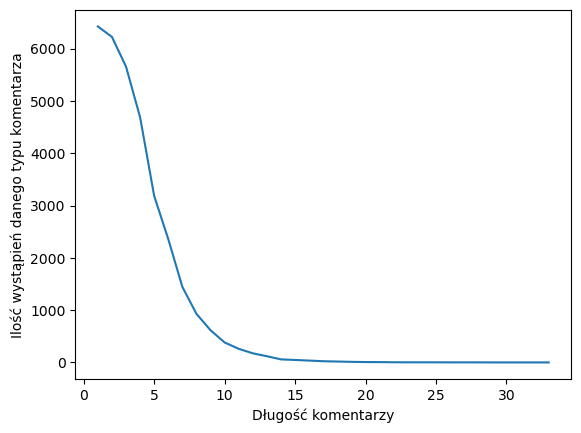

In [35]:
# Długość komentarzy
# Obliczenie z ilu wyrazów składają się komentarze
nowy_df['długość'] = nowy_df['tekst'].str.split().str.len()
counts = nowy_df['długość'].value_counts()

# Wykres
# Tworzenie osi X
x = range(1, len(counts) + 1)

# Tworzenie wykresu
plt.plot(x, counts)

# Konfiguracja etykiet osi
plt.xlabel('Długość komentarzy')
plt.ylabel('Ilość wystąpień danego typu komentarza')

# Wyświetlenie wykresu
plt.show()

### Analiza sentymentu


In [36]:
model = SentimentPLModel(from_pretrained='latest')

In [37]:
# Wykonanie analizy sentymentu na komentarzach
# Zakomentowana, gdyż długo trwa
# nowy_df['predykcja'] = nowy_df['tekst'].apply(lambda x: model(x).item())
# nowy_df

In [38]:
# Niestety wyniki są niesatysfakcjonujące

# Przykłady poniżej:
# "Brawo" - -0.17229433357715607
# "I to głowa państwa." - -0.00899549014866352
# "A niektózy nie szanują" - -0.4625290632247925
# "Inflacja" - 0.009782643988728523
# "Minuta wstydu" - 0.06330104917287827
# "Minuta prawdy" - -0.39027801156044006

#Przykład zastosowania
#print(model('Minuta prawdy').item())

### Najczęstsze słowa w komentarzach

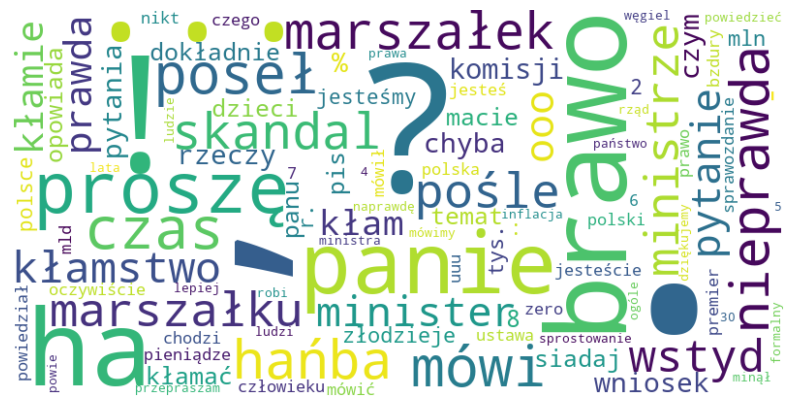

In [39]:
#Wordcloud z najczęściej pojawiającymi się słowami

# Pobranie listy polskich stop wordów
stop_words = json.loads(requests.get("https://raw.githubusercontent.com/stopwords-iso/stopwords-pl/master/stopwords-pl.json").text)

# Konkatenacja tekstu ze wszystkich wierszy kolumny 'tekst'
all_text = ' '.join(nowy_df['tekst'])

# Tokenizacja tekstu na słowa
words = word_tokenize(all_text, language='polish')

# Zamiana tokenów na małe litery
words = [word.lower() for word in words]

# Filtrowanie stop wordów
filtered_words = [word for word in words if word.casefold() not in stop_words]

# Obliczenie liczności wystąpień słów
word_counts = Counter(filtered_words)

# Inicjalizacja obiektu WordCloud
wordcloud = WordCloud(width=800, height=400, max_words=100, background_color='white').generate_from_frequencies(word_counts)

# Wyświetlenie wygenerowanego wordcloud
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')

# Zapisanie wordclouda
# plt.savefig('wordcloud.jpg', format='jpg', dpi=300)
plt.show()

In [40]:
# Wypisanie najczęstszych słów
sorted_counts = sorted(word_counts.items(), key=lambda x: x[1], reverse=True)
for word, count in sorted_counts:
    print(f'{word}: {count}')

.: 23234
,: 8734
?: 5647
!: 4680
...: 2604
brawo: 1938
ha: 1766
panie: 1098
proszę: 725
czas: 460
mówi: 435
poseł: 425
hańba: 401
nieprawda: 398
marszałek: 355
skandal: 347
pośle: 329
marszałku: 311
ministrze: 306
wstyd: 273
kłamstwo: 266
minister: 244
pytanie: 233
ooo: 231
prawda: 211
kłamie: 204
kłam: 173
komisji: 153
chyba: 146
wniosek: 146
rzeczy: 144
pytania: 143
%: 142
czym: 138
-: 137
dokładnie: 132
dzieci: 132
opowiada: 130
8: 128
macie: 128
temat: 123
kłamać: 121
pis: 118
siadaj: 117
panu: 117
złodzieje: 112
mln: 110
tys.: 110
2: 107
jesteśmy: 101
r.: 101
:: 100
polsce: 99
oczywiście: 99
premier: 98
mówił: 98
sprawozdanie: 98
mld: 97
nikt: 97
jesteś: 97
pieniądze: 95
uuu: 94
mówić: 92
jesteście: 91
czego: 91
7: 89
powiedział: 88
ustawa: 88
zero: 87
bzdury: 86
człowieku: 85
polska: 85
prawo: 84
chodzi: 83
6: 83
polski: 82
sprostowanie: 82
prawa: 81
ludzi: 80
mówimy: 79
ogóle: 79
powiedzieć: 79
ludzie: 78
minął: 78
powie: 76
naprawdę: 75
rząd: 73
ministra: 73
4: 72
lepiej: 72
ro

### Garść statystyk związanych z posłami

In [41]:
# Stworzenie kolumn zwiazanych z datą urodzenia oraz miejscem urodzenia
posłowie2[['data_urodzenia', 'miejsce_urodzenia']] = posłowie2['Data i miejsce urodzenia:'].str.split(',', 1, expand=True)

In [42]:
# Skąd pochodzą posłowie?
df_grouped = posłowie2.groupby('miejsce_urodzenia').size().reset_index(name='liczba')
df_miejsce_urodzenia = df_grouped.sort_values('liczba', ascending=False)
df_miejsce_urodzenia.head(10)

,miejsce_urodzenia,liczba
204,Warszawa,41
81,Kraków,14
212,Wrocław,10
232,Łódź,10
38,Gdańsk,9
139,Poznań,9
187,Szczecin,7
39,Gdynia,7
67,Kielce,6
123,Opole,6


In [103]:
df_top5_miasta = df_miejsce_urodzenia.head(5)

# Wykres pokazujący skąd pochodzą posłowie
fig = px.bar(df_top5_miasta, x='miejsce_urodzenia', y='liczba')

fig.update_layout(title='Miejsce urodzenia')

fig.show()

In [43]:
# Wykształcenie posłów
df_grouped = posłowie2.groupby('Wykształcenie:').size().reset_index(name='liczba')
df_wykształcenie = df_grouped.sort_values('liczba', ascending=False)
df_wykształcenie

,Wykształcenie:,liczba
0,wyższe,427
1,średnie ogólne,15
3,średnie zawodowe,9
2,średnie policealne/pomaturalne,7


In [104]:
fig = px.pie(df_wykształcenie, values='liczba', names='Wykształcenie:',
             title='Wykształcenie posłów')
fig.update_traces(textposition='inside')
fig.update_layout(uniformtext_minsize=12, uniformtext_mode='hide')
fig.show()

In [44]:
# Zawody posłów
połowie_zawod = posłowie2
połowie_zawod['Zawód:'] = połowie_zawod['Zawód:'].str.lower()

# Zmiana wartości kolumn, by móc zgrupować podobne zawody
połowie_zawod.loc[połowie_zawod['Zawód:'].str.contains('inżynier', case=False), 'Zawód:'] = 'inżynier'
połowie_zawod.loc[posłowie2['Zawód:'].str.contains('inż', case=False), 'Zawód:'] = 'inżynier'
połowie_zawod.loc[posłowie2['Zawód:'].str.contains('lekarz', case=False), 'Zawód:'] = 'lekarz'
połowie_zawod.loc[posłowie2['Zawód:'].str.contains('radca prawny', case=False), 'Zawód:'] = 'prawnik'
połowie_zawod.loc[posłowie2['Zawód:'].str.contains('adwokat', case=False), 'Zawód:'] = 'parlamentarzysta'

połowie_zawod.loc[posłowie2['Zawód:'].str.contains('poseł', case=False), 'Zawód:'] = 'parlamentarzysta'
połowie_zawod.loc[posłowie2['Zawód:'].str.contains('poseł na Sejm RP', case=False), 'Zawód:'] = 'parlamentarzysta'
połowie_zawod.loc[posłowie2['Zawód:'].str.contains('ekonomistka', case=False), 'Zawód:'] = 'ekonomista'
połowie_zawod.loc[posłowie2['Zawód:'].str.contains('samorząd', case=False), 'Zawód:'] = 'przedstawiciel władzy samorządowej'
połowie_zawod.loc[posłowie2['Zawód:'].str.contains('menadżer', case=False), 'Zawód:'] = 'menedżer'

połowie_zawod.loc[posłowie2['Zawód:'].str.contains('parlamentarzystka', case=False), 'Zawód:'] = 'parlamentarzysta'
połowie_zawod.loc[posłowie2['Zawód:'].str.contains('urzędnik', case=False), 'Zawód:'] = 'urzędnik'
połowie_zawod.loc[posłowie2['Zawód:'].str.contains('samorządowiec', case=False), 'Zawód:'] = 'przedstawiciel władzy samorządowej'
połowie_zawod.loc[posłowie2['Zawód:'].str.contains('notariusz', case=False), 'Zawód:'] = 'prawnik'
połowie_zawod.loc[posłowie2['Zawód:'].str.contains('prawniczka', case=False), 'Zawód:'] = 'prawnik'

połowie_zawod.loc[posłowie2['Zawód:'].str.contains('dziennikarka', case=False), 'Zawód:'] = 'dziennikarz'
połowie_zawod.loc[posłowie2['Zawód:'].str.contains('wykładowca akademicki', case=False), 'Zawód:'] = 'nauczyciel akademicki'
połowie_zawod.loc[posłowie2['Zawód:'].str.contains('profesor', case=False), 'Zawód:'] = 'nauczyciel akademicki'
połowie_zawod.loc[posłowie2['Zawód:'].str.contains('pracownik administracji', case=False), 'Zawód:'] = 'urzędnik'
połowie_zawod.loc[posłowie2['Zawód:'].str.contains('informaty', case=False), 'Zawód:'] = 'informatyk'

połowie_zawod.loc[posłowie2['Zawód:'].str.contains('programist', case=False), 'Zawód:'] = 'informatyk'
połowie_zawod.loc[posłowie2['Zawód:'].str.contains('nauczyciel akademicki', case=False), 'Zawód:'] = 'nauczyciel akademicki'
połowie_zawod.loc[posłowie2['Zawód:'].str.contains('filolo', case=False), 'Zawód:'] = 'filolog'
połowie_zawod.loc[posłowie2['Zawód:'].str.contains('nauczyciel historii', case=False), 'Zawód:'] = 'nauczyciel'
połowie_zawod.loc[posłowie2['Zawód:'].str.contains('nauczyciel wychowania fizycznego', case=False), 'Zawód:'] = 'nauczyciel'

połowie_zawod.loc[posłowie2['Zawód:'].str.contains('nauczycielka', case=False), 'Zawód:'] = 'nauczyciel'
połowie_zawod.loc[posłowie2['Zawód:'].str.contains('przedsiębiorca', case=False), 'Zawód:'] = 'przedsiębiorca'
połowie_zawod.loc[posłowie2['Zawód:'].str.contains('socjo', case=False), 'Zawód:'] = 'socjolog'
połowie_zawod.loc[posłowie2['Zawód:'].str.contains('rolnik', case=False), 'Zawód:'] = 'rolnik'

df_grouped = połowie_zawod.groupby('Zawód:').size().reset_index(name='liczba')
df_grouped_sorted = df_grouped.sort_values('liczba', ascending=False)

#Ciekawostka - jest tylk jedna filozofka (brak filozofów, choć trochę osób ukończyło wydział filozofii)
df_grouped_sorted.head(20)

,Zawód:,liczba
42,parlamentarzysta,107
48,prawnik,43
17,ekonomista,39
44,politolog,27
26,inżynier,21
41,nauczyciel akademicki,21
50,przedsiębiorca,19
51,przedstawiciel władzy samorządowej,18
32,lekarz,16
40,nauczyciel,15


In [105]:
df_top5_zawody = df_grouped_sorted.head(5)

# Wykres zawodów wykonywanych przez posłów
fig = px.bar(df_top5_zawody, x='Zawód:', y='liczba')

fig.update_layout(title='Zawody')

fig.show()

### Przygotowanie danych do analizy przemów

In [45]:
def czy_posel(mowca):
    ###############################################################
    # Niniejsza funkcja określa, czy dane wystąpienie zostało     #
    # wygłoszone przez posła/posłankę. Wystąpienie może bowiem    #
    # być autorstwa ministrów, podsekretarzy stanu, itp.          #
    #                                                             #
    # Zwraca:                                                     #
    # 1 jeśli słowo "Poseł" występuje w polu "Mówca" (główna rola #
    # autora/autorki wystąpienia), zaś 0 w przeciwnym wypadku.    #
    #                                                             #
    # Parametry:                                                  #
    # mowca [string] -- zawartość pola "Mówca" ze strony Sejmu,   #
    # zawierającą informacje o autorze wystąpienia.               #
    ###############################################################

    if "Poseł" in mowca:
        wynik = 1
    else:
        wynik = 0

    return wynik

In [46]:
df_wypowiedzi["czy_posel"] = df_wypowiedzi["poseł"].apply(func=czy_posel)

In [47]:
df_wypowiedzi.drop(df_wypowiedzi[df_wypowiedzi["czy_posel"] == 0].index, inplace=True)

In [48]:
df_wypowiedzi["poseł"] = df_wypowiedzi["poseł"].apply(func=imie_nazwisko)

In [49]:
regex = r'\((.*?)\)'

#Oczyszczenie mowy z komentarzy
wypowiedzi['mowa'] = wypowiedzi['mowa'].str.replace(regex, '')

In [50]:
stop_words = json.loads(requests.get("https://raw.githubusercontent.com/stopwords-iso/stopwords-pl/master/stopwords-pl.json").text)

In [51]:
def lematyzacja(mowa, stop_words=stop_words):
    ################################################################
    # Niniejsza funkcja przeprowadza normalizację oraz lematyzację #
    # tekstu:                                                      #
    #  * usuwane są znaki specjalne,                               #
    #  * wszystkie litery są zapisane jako małe,                   #
    #  * usuwane są tzw. stop words, czyli słowa, które nie wnoszą #
    #    dodatkowej informacji (np. spójniki).                     #
    # Następnie przeprowadzana jest lamatyzacja za pomocą pakietu  #
    # spaCy (moduł języka polskiego: pl_core_news_md).             #
    #                                                              #
    # Zwraca:                                                      #
    # listę słów zawartych w przemówieniu po zakończeniu procesu   #
    # normalizacji i lematyzacji.                                  #
    #                                                              #
    # Parametry:                                                   #
    # mowa [string] -- treść wystąpienia posła/posłanki.           #
    # stop_words [lista] -- lista zawierająca wszystkie słowa,     #
    # które mają być usunięte.                                     #
    ################################################################

    lista_slow = re.split("[-\s.,;!?]+", mowa)
    # lista_slow = [slowo.lower() for slowo in lista_slow]
    lista_slow = [slowo for slowo in lista_slow if slowo.lower() not in stop_words]

    # nlp = spacy.load('pl_core_news_md')
    # mowa_po_lematyzacji = [nlp(slowo) for slowo in lista_slow]
    # wynik = mowa_po_lematyzacji
    wynik = " ".join(lista_slow)

    return wynik

In [52]:
df_wypowiedzi["mowa"] = df_wypowiedzi["mowa"].apply(func=lematyzacja)

In [53]:
df_wypowiedzi["mowa"]

1        (Sekretarz poseł odczytuje nazwiska posłów) Po...
2        Poseł Piotr Gliński: Ślubuję dopomóż Bóg Poseł...
3        Poseł Łukasz Szumowski: Ślubuję dopomóż Bóg Po...
4        Poseł Piotr Kaleta: Ślubuję dopomóż Bóg Poseł ...
5        Poseł Waldemar Buda: Ślubuję dopomóż Bóg Poseł...
                               ...                        
35701    Szanowna Marszałek Wysoka Izbo Spotykamy Dniu ...
35702    Uroczystości Szarajówce Marszałek Wysoka Izbo ...
35703    Oświadczenie sprawie promocji honorowego krwio...
35704    Szanowna Marszałek Wysoka Izbo Panie Panowie P...
35705    Szanowna Marszałek oświadczeniu poselskim chci...
Name: mowa, Length: 32691, dtype: object

## Analiza

### Ogólne statystyki

Sprawdźmy, który z parlamentarzystów najczęściej zabierał głos.

In [54]:
df_poslowie.head()

,poseł,klub/koło,Liczba wypowiedzi (W tym jako członka RM)
0,Mirosław Suchoń,Polska2050,1036
1,Jan Szopiński,Lewica,970
2,Grzegorz Braun,Konfederacja,736
3,Tadeusz Tomaszewski,Lewica,519
4,Rafał Adamczyk,Lewica,462


Zobaczmy także, kto udzielał się najmniej.

In [55]:
df_poslowie.tail()

,poseł,klub/koło,Liczba wypowiedzi (W tym jako członka RM)
462,Leonard Krasulski,PiS,1
463,Paweł Kukiz,Kukiz15,1
464,Aleksandra Łapiak,PiS,1
465,Marcin Ociepa,PiS,1
466,Dominik Tarczyński,PiS,1


Sprawdźmy, jak wyglądają zagregowane wyniki dla poszczególnych formacji politycznych.

In [56]:
wystapienia_per_capita = list(df_poslowie.groupby(["klub/koło"]).sum()["Liczba wypowiedzi (W tym jako członka RM)"] / df_poslowie.groupby(["klub/koło"]).count()["poseł"])
partie = list(np.sort(df_poslowie["klub/koło"].unique()))

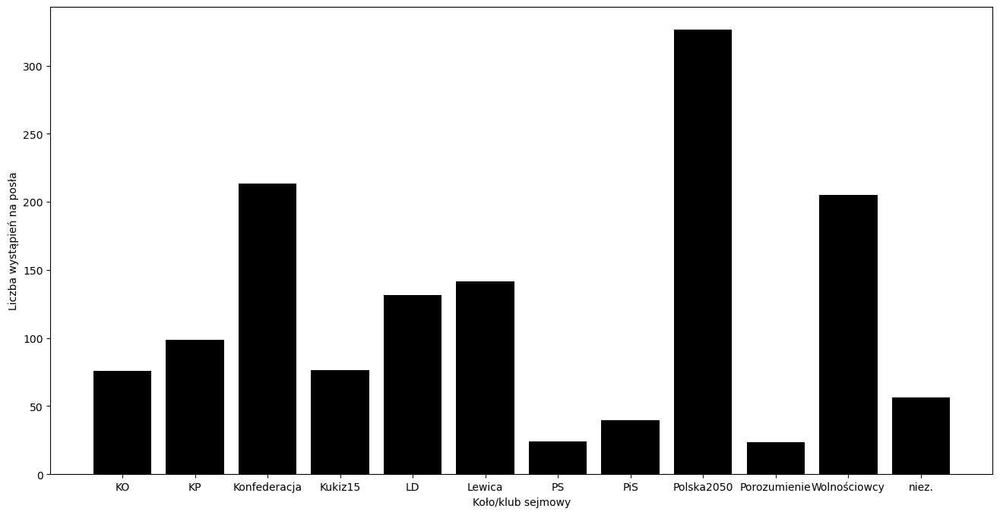

In [57]:
plt.figure(figsize=(16, 8))
plt.bar(partie, wystapienia_per_capita, color="black")
plt.xlabel("Koło/klub sejmowy")
plt.ylabel("Liczba wystąpień na posła")
# plt.savefig("wypowiedzi_partie.jpg")
plt.show()

### Modelowanie tematyczne

In [58]:
topic_model = BERTopic(language="multilingual", calculate_probabilities=True, verbose=True)

#### Wszystkie wystąpienia

W pierwszej kolejności możemy dokonać analizy tematycznej zbioru złożonego ze wszystkich wystąpień posłów, które zostały dotychczas wygłoszone.

In [59]:
mowa_wszystkie = df_wypowiedzi["mowa"]
topics, probs = topic_model.fit_transform(mowa_wszystkie)

Batches:   0%|          | 0/1022 [00:00<?, ?it/s]

2023-06-24 21:19:32,430 - BERTopic - Transformed documents to Embeddings
2023-06-24 21:20:12,176 - BERTopic - Reduced dimensionality
2023-06-24 21:22:41,201 - BERTopic - Clustered reduced embeddings


In [60]:
freq = topic_model.get_topic_info(); freq.head(12)

,Topic,Count,Name,Representation,Representative_Docs
0,-1,15865,-1_panie_poseł_dziękuję_oklaski,"[panie, poseł, dziękuję, oklaski, państwo, sal...",[Panie Marszałku Wysoka Izbo przyjemność przyj...
1,0,1035,0_pamięci_powstania_historii_rocznicę,"[pamięci, powstania, historii, rocznicę, ks, ż...",[Szanowna Marszałek Wysoka Izbo poniedziałek 2...
2,1,592,1_emerytury_emerytów_emerytura_emeryturę,"[emerytury, emerytów, emerytura, emeryturę, em...",[Szanowna Marszałek Panie Ministrze Panie Pano...
3,2,543,2_mieszkań_mieszkania_mieszkanie_nieruchomości,"[mieszkań, mieszkania, mieszkanie, nieruchomoś...",[Dziękuję Szanowna Marszałek Wysoka Izbo imien...
4,3,466,3_rosji_putina_ukrainę_ukrainy,"[rosji, putina, ukrainę, ukrainy, ukrainie, ro...",[dziękuję Szanowna Marszałek Szanowni Panie Pa...
5,4,423,4_szczepień_covid_szczepienia_szczepionek,"[szczepień, covid, szczepienia, szczepionek, s...",[Panie Marszałku Minister Wysoki Sejmie Przypa...
6,5,353,5_wody_morskich_morskiej_żeglugi,"[wody, morskich, morskiej, żeglugi, brzegów, ś...",[Szanowna Marszałek Wysoka Izbo Panie Ministrz...
7,6,328,6_telewizji_radiofonii_mediów_tvp,"[telewizji, radiofonii, mediów, tvp, narodowyc...",[Marszałek Wysoki Sejmie okazji głosowania war...
8,7,316,7_linii_kolejowych_kolejowej_kolei,"[linii, kolejowych, kolejowej, kolei, kolej, p...",[Marszałek Panie Ministrze Wysoki Sejmie zaszc...
9,8,311,8_dyrektywy_europejskiej_konsumentów_unii,"[dyrektywy, europejskiej, konsumentów, unii, p...",[Marszałek Wysoka Izbo zaszczyt przedstawić im...


In [61]:
topic_model.visualize_topics()

In [62]:
topic_model.visualize_barchart(top_n_topics=10, n_words=10)
# fig = topic_model.visualize_barchart(top_n_topics=10, n_words=10)
# fig.write_html("tematy_wszystkie_wypowiedzi.html")

#### Wystąpienia poszczególnych partii

Wykonajmy teraz modelowanie tematyczne wystąpień poszczególnych klubów/kół poselskich. Ograniczmy się tylko do tych najważniejszych.

In [63]:
df_wypowiedzi

,poseł,mowa,data,posiedzenie,dzień_posiedzenia,numer_wypowiedzi,czy_wygloszony,czy_posel
1,Daniel Milewski,(Sekretarz poseł odczytuje nazwiska posłów) Po...,12-11-2019,1,1,2,0,1
2,Mateusz Bochenek,Poseł Piotr Gliński: Ślubuję dopomóż Bóg Poseł...,12-11-2019,1,1,3,0,1
3,Daniel Milewski,Poseł Łukasz Szumowski: Ślubuję dopomóż Bóg Po...,12-11-2019,1,1,4,0,1
4,Mateusz Bochenek,Poseł Piotr Kaleta: Ślubuję dopomóż Bóg Poseł ...,12-11-2019,1,1,5,0,1
5,Daniel Milewski,Poseł Waldemar Buda: Ślubuję dopomóż Bóg Poseł...,12-11-2019,1,1,6,0,1
...,...,...,...,...,...,...,...,...
35701,Agnieszka Soin,Szanowna Marszałek Wysoka Izbo Spotykamy Dniu ...,26-05-2023,76,3,258,1,1
35702,Beata Strzałka,Uroczystości Szarajówce Marszałek Wysoka Izbo ...,26-05-2023,76,3,259,1,1
35703,Andrzej Szejna,Oświadczenie sprawie promocji honorowego krwio...,26-05-2023,76,3,260,1,1
35704,Jan Szopiński,Szanowna Marszałek Wysoka Izbo Panie Panowie P...,26-05-2023,76,3,261,1,1


In [64]:
df_poslowie

,poseł,klub/koło,Liczba wypowiedzi (W tym jako członka RM)
0,Mirosław Suchoń,Polska2050,1036
1,Jan Szopiński,Lewica,970
2,Grzegorz Braun,Konfederacja,736
3,Tadeusz Tomaszewski,Lewica,519
4,Rafał Adamczyk,Lewica,462
...,...,...,...
462,Leonard Krasulski,PiS,1
463,Paweł Kukiz,Kukiz15,1
464,Aleksandra Łapiak,PiS,1
465,Marcin Ociepa,PiS,1


In [65]:
df_wypowiedzi_partii = pd.merge(df_wypowiedzi, df_poslowie, on="poseł", how="inner")

In [66]:
mowa_ko = df_wypowiedzi_partii.where(df_wypowiedzi_partii["klub/koło"]=="KO").dropna()["mowa"]
mowa_konf = df_wypowiedzi_partii.where(df_wypowiedzi_partii["klub/koło"]=="Konfederacja").dropna()["mowa"]
mowa_lew = df_wypowiedzi_partii.where(df_wypowiedzi_partii["klub/koło"]=="Lewica").dropna()["mowa"]
mowa_pis = df_wypowiedzi_partii.where(df_wypowiedzi_partii["klub/koło"]=="PiS").dropna()["mowa"]
mowa_pl = df_wypowiedzi_partii.where(df_wypowiedzi_partii["klub/koło"]=="Polska2050").dropna()["mowa"]

In [67]:
mowa_ko

57       Poseł Piotr Gliński: Ślubuję dopomóż Bóg Poseł...
58       Poseł Piotr Kaleta: Ślubuję dopomóż Bóg Poseł ...
59       Poseł Jan Warzecha: Ślubuję dopomóż Bóg Poseł ...
60       Poseł Wojciech Zubowski: Ślubuję dopomóż Bóg P...
61       Poseł Władysław Dajczak: Ślubuję dopomóż Bóg P...
                               ...                        
32618    Marszałek Wysoka Izbo imieniu Klubu Parlamenta...
32619    Marszałek Wysoka Izbo Szanowny Panie Ministrze...
32620    Panie Marszałku Wysoka Izbo imieniu Klubu Parl...
32621    Szanowna Marszałek Wysoka Izbo Szanowny Panie ...
32622    Panie Marszałku Minister Wysoka Izbo imieniu K...
Name: mowa, Length: 9966, dtype: object

* Koalicja Obywatelska

In [68]:
topics, probs = topic_model.fit_transform(mowa_ko)

Batches:   0%|          | 0/312 [00:00<?, ?it/s]

2023-06-24 21:33:37,274 - BERTopic - Transformed documents to Embeddings
2023-06-24 21:33:47,667 - BERTopic - Reduced dimensionality
2023-06-24 21:33:54,359 - BERTopic - Clustered reduced embeddings


In [69]:
freq = topic_model.get_topic_info(); freq.head(12)

,Topic,Count,Name,Representation,Representative_Docs
0,-1,4611,-1_panie_poseł_oklaski_dziękuję,"[panie, poseł, oklaski, dziękuję, państwo, wys...",[Panie Marszałku Wysoka Izbo Panie Ministrze n...
1,0,291,0_zdrowia_lekarzy_medycznych_szpitali,"[zdrowia, lekarzy, medycznych, szpitali, pacje...",[Marszałek Wysoki Sejmie zaszczyt imieniu Klub...
2,1,249,1_ukrainy_uchodźców_rosji_pomocy,"[ukrainy, uchodźców, rosji, pomocy, putina, po...",[Panie Marszałku Panie Ministrze Wysoka Izbo B...
3,2,245,2_rolników_rolnictwa_rolnicy_rolnych,"[rolników, rolnictwa, rolnicy, rolnych, rolnik...",[Szanowna Marszałek Panie Ministrze Szanowni P...
4,3,211,3_emerytów_emerytury_emerytura_emeryturę,"[emerytów, emerytury, emerytura, emeryturę, em...",[Dziękuję Marszałek Wysoka Izbo Szanowny Panie...
5,4,140,4_mieszkań_mieszkanie_mieszkania_program,"[mieszkań, mieszkanie, mieszkania, program, mł...",[marszałek (Poseł Anna Paluch: Panie marszałku...
6,5,136,5_mld_budżet_budżetu_finansów,"[mld, budżet, budżetu, finansów, wydatków, wyd...",[Panie Marszałku Wysoki Sejmie początek dobrą ...
7,6,118,6_nauczycieli_czarnek_edukacji_szkole,"[nauczycieli, czarnek, edukacji, szkole, szkoł...",[Panie Panowie Posłowie Panie Marszałku minist...
8,7,115,7_postępowania_ustawy_zmiany_projekt,"[postępowania, ustawy, zmiany, projekt, projek...",[Panie Marszałku Wysoka Izbo Przypadł zaszczyt...
9,8,110,8_telewizji_radiofonii_mediów_tvp,"[telewizji, radiofonii, mediów, tvp, media, ra...",[Panie Marszałku Panie Panowie Posłowie Zastan...


In [70]:
topic_model.visualize_topics()

In [71]:
topic_model.visualize_barchart(top_n_topics=10, n_words=10)

* Konfederacja

In [72]:
topics, probs = topic_model.fit_transform(mowa_konf)

Batches:   0%|          | 0/63 [00:00<?, ?it/s]

2023-06-24 21:36:06,710 - BERTopic - Transformed documents to Embeddings
2023-06-24 21:36:13,980 - BERTopic - Reduced dimensionality
2023-06-24 21:36:14,193 - BERTopic - Clustered reduced embeddings


In [73]:
freq = topic_model.get_topic_info(); freq.head(12)

,Topic,Count,Name,Representation,Representative_Docs
0,-1,777,-1_panie_poseł_dziękuję_państwo,"[panie, poseł, dziękuję, państwo, oklaski, dzw...",[Panie Marszałku Wysoka Izbo Art 38 konstytucj...
1,0,183,0_poseł_panie_wicemarszałek_grzegorz,"[poseł, panie, wicemarszałek, grzegorz, braun,...",[trybie sprostowania marszałek Wicemarszałek M...
2,1,108,1_marszałek_komisji_sejmu_poseł,"[marszałek, komisji, sejmu, poseł, panie, wnio...",[Marszałek Wysoka Izbo Wczoraj odbyło ważne po...
3,2,105,2_rolników_rolnictwa_rolnicy_rolnikom,"[rolników, rolnictwa, rolnicy, rolnikom, zwier...",[Panie Marszałku Wysoka Izbo wsparcia rolnictw...
4,3,78,3_podatki_podatek_vat_podatków,"[podatki, podatek, vat, podatków, polaków, pod...",[Panie Marszałku Wysoka Izbo 8 rządów PiS lata...
5,4,62,4_polska_europejskiej_pis_państwo,"[polska, europejskiej, pis, państwo, oklaski, ...",[Panie Marszałku Wysoki Sejmie pierwszej kolej...
6,5,61,5_rosji_ukrainy_uchodźców_ukrainie,"[rosji, ukrainy, uchodźców, ukrainie, dzwonek,...",[Panie Marszałku Wysoka Izbo Niestety posłanka...
7,6,56,6_unii_europejskiej_polski_prawa,"[unii, europejskiej, polski, prawa, umowy, pol...",[Panie Marszałku Wysoka Izbo Czego ogóle ustaw...
8,7,51,7_poseł_sali_głos_marszałek,"[poseł, sali, głos, marszałek, państwo, panie,...",[Panie Marszałku Wysoka Izbo Kaczyński dymisji...
9,8,49,8_dzieci_dziecka_dziecko_życia,"[dzieci, dziecka, dziecko, życia, poseł, dzięk...",[Panie Marszałku Wysoka Izbo Konfederacja kons...


In [74]:
topic_model.visualize_topics()

In [75]:
topic_model.visualize_barchart(top_n_topics=10, n_words=10)

* Lewica

In [76]:
topics, probs = topic_model.fit_transform(mowa_lew)

Batches:   0%|          | 0/200 [00:00<?, ?it/s]

2023-06-24 21:43:11,323 - BERTopic - Transformed documents to Embeddings
2023-06-24 21:43:19,290 - BERTopic - Reduced dimensionality
2023-06-24 21:43:21,322 - BERTopic - Clustered reduced embeddings


In [77]:
freq = topic_model.get_topic_info(); freq.head(12)

,Topic,Count,Name,Representation,Representative_Docs
0,-1,2622,-1_panie_dziękuję_wysoka_izbo,"[panie, dziękuję, wysoka, izbo, ustawy, oklask...",[Panie Marszałku Wysoka Izbo Panie Premierze i...
1,0,477,0_zdrowia_covid_pacjentów_medycznych,"[zdrowia, covid, pacjentów, medycznych, szpita...",[Szanowny Panie Marszałku Wysoka Izbo Szanowni...
2,1,178,1_rolników_rolnictwa_rolnicy_żywności,"[rolników, rolnictwa, rolnicy, żywności, produ...",[Marszałek Panie Ministrze Wysoka Izbo zaszczy...
3,2,173,2_emerytury_emerytów_emerytur_emeryturę,"[emerytury, emerytów, emerytur, emeryturę, sen...",[Wysoka Izbo 9 mln osób niemal czwarty obywate...
4,3,155,3_dzieci_rodziny_niepełnosprawnościami_osób,"[dzieci, rodziny, niepełnosprawnościami, osób,...",[Panie Marszałku Minister Wysoka Izbo Zajmujem...
5,4,130,4_mieszkań_mieszkania_nieruchomości_mieszkanie,"[mieszkań, mieszkania, nieruchomości, mieszkan...",[Szanowna Marszałek Panie Ministrze Wysoka Izb...
6,5,127,5_kobiet_kobiety_ciąży_aborcji,"[kobiet, kobiety, ciąży, aborcji, kobietom, ci...",[Panie Marszałku Wysoka Izbo historię opowiedz...
7,6,122,6_nauczycieli_edukacji_szkoły_czarnek,"[nauczycieli, edukacji, szkoły, czarnek, szkół...",[Marszałek Wysoka Izbo powiedziano ustawa znan...
8,7,110,7_linii_kolejowych_kolejowej_transportu,"[linii, kolejowych, kolejowej, transportu, kol...",[Panie Marszałku Wysoka Izbo Panie Ministrze t...
9,8,97,8_rząd_podatku_przedsiębiorców_mln,"[rząd, podatku, przedsiębiorców, mln, mld, pan...",[Panie Marszałku Wysoka Izbo Prawdę mówiąc myś...


In [78]:
topic_model.visualize_topics()

In [79]:
topic_model.visualize_barchart(top_n_topics=10, n_words=10)
# fig = topic_model.visualize_barchart(top_n_topics=10, n_words=10)
# fig.write_html("tematy_lewica.html")

* Prawo i Sprawiedliwość

In [80]:
topics, probs = topic_model.fit_transform(mowa_pis)

Batches:   0%|          | 0/249 [00:00<?, ?it/s]

2023-06-24 21:52:07,344 - BERTopic - Transformed documents to Embeddings
2023-06-24 21:52:16,633 - BERTopic - Reduced dimensionality
2023-06-24 21:52:21,413 - BERTopic - Clustered reduced embeddings


In [81]:
freq = topic_model.get_topic_info(); freq.head(12)

,Topic,Count,Name,Representation,Representative_Docs
0,-1,2632,-1_poseł_panie_dziękuję_państwo,"[poseł, panie, dziękuję, państwo, ustawy, sali...",[Szanowna Marszałek Wysoki Sejmie Komisja Fina...
1,0,592,0_ks_pamięci_św_żołnierzy,"[ks, pamięci, św, żołnierzy, polski, historii,...",[Marszałek Wysoki Sejmie obchodzimy 74 rocznic...
2,1,348,1_finansów_publicznych_komisja_ustawy,"[finansów, publicznych, komisja, ustawy, komis...",[Szanowna Marszałek Wysoki Sejmie zaszczyt prz...
3,2,190,2_zdrowia_medycznych_lekarza_ochronę,"[zdrowia, medycznych, lekarza, ochronę, lekarz...",[Marszałek Wysoka Izbo ramach ustawy budżetowe...
4,3,157,3_linii_dróg_drogi_inwestycji,"[linii, dróg, drogi, inwestycji, obwodnic, kol...",[Marszałek Wysoka Izbo 29 listopada 2021 r zos...
5,4,139,4_ruchu_infrastruktury_drogowego_drogowym,"[ruchu, infrastruktury, drogowego, drogowym, p...",[Marszałek Panie Ministrze Wysoki Sejmie zaszc...
6,5,131,5_szczepień_covid_zdrowia_szczepienia,"[szczepień, covid, zdrowia, szczepienia, 19, z...",[Dziękuję Panie Marszałku Panie Ministrze Wyso...
7,6,114,6_mieszkań_mieszkania_mieszkaniowych_budownictwa,"[mieszkań, mieszkania, mieszkaniowych, budowni...",[Dziękuję Wysoka Izbo Poprawa dostępności mies...
8,7,109,7_poseł_sali_głos_proszę,"[poseł, sali, głos, proszę, wicemarszałek, poś...",[państwo uspokoicie odpowiem (Poruszenie sali)...
9,8,98,8_społecznej_rodziny_polityki_ustawy,"[społecznej, rodziny, polityki, ustawy, komisj...",[Marszałek Wysoka Izbo Przedstawiam dodatkowe ...


In [82]:
topic_model.visualize_topics()

In [83]:
topic_model.visualize_barchart(top_n_topics=10, n_words=10)

* Polska 2050

In [84]:
topics, probs = topic_model.fit_transform(mowa_pl)

Batches:   0%|          | 0/64 [00:00<?, ?it/s]

2023-06-24 21:54:46,816 - BERTopic - Transformed documents to Embeddings
2023-06-24 21:54:53,611 - BERTopic - Reduced dimensionality
2023-06-24 21:54:53,846 - BERTopic - Clustered reduced embeddings


In [85]:
freq = topic_model.get_topic_info(); freq.head(12)

,Topic,Count,Name,Representation,Representative_Docs
0,-1,863,-1_panie_dziękuję_ministrze_wysoka,"[panie, dziękuję, ministrze, wysoka, izbo, okl...",[dziękuję Panie Marszałku Panie Ministrze Wyso...
1,0,147,0_energii_węgla_panie_ceny,"[energii, węgla, panie, ceny, gazu, rząd, pose...",[Dziękuję Panie Marszałku Panie Panowie Posłow...
2,1,88,1_uchwały_dziękuję_wysoka_izbo,"[uchwały, dziękuję, wysoka, izbo, historia, śl...",[Dziękuję Panie Marszałku Wysoki Sejmie począt...
3,2,81,2_ustawy_projektu_polska_2050,"[ustawy, projektu, polska, 2050, podatku, proj...",[Uprzejmie dziękuję Szanowna Marszałek Wysoka ...
4,3,67,3_zdrowia_panie_ministrze_pacjentów,"[zdrowia, panie, ministrze, pacjentów, szpital...",[Panie Marszałku Panie Ministrze Panie Panowie...
5,4,62,4_panie_ministrze_dziękuję_pytanie,"[panie, ministrze, dziękuję, pytanie, dane, da...",[Czcigodny Panie Marszałku Panie Ministrze Wys...
6,5,58,5_rolników_rolnictwa_ustawy_dziękuję,"[rolników, rolnictwa, ustawy, dziękuję, projek...",[dziękuję Szanowna Marszałek Panie Ministrze W...
7,6,53,6_polska_panie_polski_europejskiej,"[polska, panie, polski, europejskiej, dziękuję...",[Dziękuję Panie Marszałku Panie Ministrze Wyso...
8,7,42,7_poseł_ukrainie_rosyjskich_marszałek,"[poseł, ukrainie, rosyjskich, marszałek, pis, ...",[Panie Marszałku Wysoka Izbo Dzisiejszy sabota...
9,8,41,8_ruchu_pojazdów_kolejowych_ustawy,"[ruchu, pojazdów, kolejowych, ustawy, linii, d...",[dziękuję Panie Marszałku Panie Ministrze Wyso...


In [86]:
topic_model.visualize_topics()

In [87]:
topic_model.visualize_barchart(top_n_topics=10, n_words=10)

#### Wystąpienia z poszczególnych posiedzeń

Spójrzmy jeszcze, co znajdziemy, gdy analizie poddamy poszczególne posiedzenia Sejmu RP.

* Posiedzenie odbyte w dniach 27-28 października 2020 roku.

In [88]:
mowa_pos_20 = df_wypowiedzi.where(df_wypowiedzi["posiedzenie"]==20).dropna()["mowa"]

In [89]:
topics, probs = topic_model.fit_transform(mowa_pos_20)

Batches:   0%|          | 0/10 [00:00<?, ?it/s]

2023-06-24 21:55:16,833 - BERTopic - Transformed documents to Embeddings
2023-06-24 21:55:19,449 - BERTopic - Reduced dimensionality
2023-06-24 21:55:19,466 - BERTopic - Clustered reduced embeddings


In [90]:
freq = topic_model.get_topic_info(); freq.head(12)

,Topic,Count,Name,Representation,Representative_Docs
0,-1,51,-1_poseł_dziękuję_osób_panie,"[poseł, dziękuję, osób, panie, proszę, wicemar...",[dziękuję Panie Marszałku Wysoka Izbo Docieraj...
1,0,98,0_sali_poseł_panie_głos,"[sali, poseł, panie, głos, oklaski, zdrowia, p...",[Panie marszałku prosiłbym przydział czasu pre...
2,1,55,1_kobiet_poseł_kobiety_prawa,"[kobiet, poseł, kobiety, prawa, ciąży, oklaski...",[Panie Marszałku Wysoka Izbo Panie Prezesie Ka...
3,2,44,2_cit_spółki_spółek_polsce,"[cit, spółki, spółek, polsce, przedsiębiorców,...",[Dziękuję Szanowna Marszałek Wysoka Izbo Cieka...
4,3,31,3_ustawy_zwierząt_komisji_europejskiej,"[ustawy, zwierząt, komisji, europejskiej, komi...",[Szanowny Panie Marszałku Wysoka Izbo zaszczyt...
5,4,15,4_mieszkań_mieszkanie_program_kzn,"[mieszkań, mieszkanie, program, kzn, wysoka, i...",[Szanowny Panie Marszałku Wysoka Izbo zaszczyt...
6,5,12,5_spółdzielnie_spółdzielni_spółdzielniach_spół...,"[spółdzielnie, spółdzielni, spółdzielniach, sp...",[Marszałek Wysoka Izbo przyjemność zaprezentow...
7,6,11,6_kontroli_izby_nik_najwyższej,"[kontroli, izby, nik, najwyższej, prezesa, 201...",[Szanowna Marszałek Chciałem powiedzieć: panie...


In [91]:
topic_model.visualize_topics()

In [92]:
topic_model.visualize_barchart(top_n_topics=10, n_words=10)
# fig = topic_model.visualize_barchart(top_n_topics=10, n_words=10)
# fig.write_html("wypowiedzi_aborcja.html")

* Posiedzenie odbyte w danich 23-24 lutego oraz 3 marca 2022 roku.

In [93]:
mowa_pos_49 = df_wypowiedzi.where(df_wypowiedzi["posiedzenie"]==49).dropna()["mowa"]

In [94]:
topics, probs = topic_model.fit_transform(mowa_pos_49)

Batches:   0%|          | 0/13 [00:00<?, ?it/s]

2023-06-24 21:55:51,950 - BERTopic - Transformed documents to Embeddings
2023-06-24 21:55:54,750 - BERTopic - Reduced dimensionality
2023-06-24 21:55:54,776 - BERTopic - Clustered reduced embeddings


In [95]:
freq = topic_model.get_topic_info(); freq.head(12)

,Topic,Count,Name,Representation,Representative_Docs
0,-1,59,-1_panie_dziękuję_oklaski_poseł,"[panie, dziękuję, oklaski, poseł, państwo, min...",[Marszałek Panie Panowie Posłowie Szanowni Pań...
1,0,79,0_oklaski_panie_ukrainy_dziękuję,"[oklaski, panie, ukrainy, dziękuję, polski, ma...",[Dziękuję Panie Marszałku Panie Ministrze Wyso...
2,1,62,1_ustawy_agencji_spółki_dziękuję,"[ustawy, agencji, spółki, dziękuję, marszałek,...",[Szanowna Marszałek Panie Ministrze Wysoka Izb...
3,2,47,2_transportu_dziękuję_ustawy_panie,"[transportu, dziękuję, ustawy, panie, transpor...",[Marszałek Wysoka Izbo Dnia 1 lutego Rada Mini...
4,3,43,3_ustawy_publicznej_przestrzeni_nazwy,"[ustawy, publicznej, przestrzeni, nazwy, ustaw...",[Szanowna Marszałek Panie Panowie Posłowie imi...
5,4,36,4_ustawy_panie_projekt_europejskiej,"[ustawy, panie, projekt, europejskiej, unii, e...",[dziękuję Panie Marszałku Panie Ministrze Wyso...
6,5,26,5_ppe_emerytalnych_pracodawców_pracowniczych,"[ppe, emerytalnych, pracodawców, pracowniczych...",[Marszałek Wysoki Sejmie Przedkładam sprawozda...
7,6,23,6_gazu_gaz_sieci_projekt,"[gazu, gaz, sieci, projekt, dziękuję, ministrz...",[Marszałek Wysoka Izbo prawda chwilą powiedzia...
8,7,17,7_podatku_podatek_panie_30,"[podatku, podatek, panie, 30, ministrze, zdrow...",[Panie Marszałku Wysoka Izbo Polski Ład będzie...
9,8,12,8_przedsiębiorców_sali_głos_panie,"[przedsiębiorców, sali, głos, panie, polskich,...",[Marszałek Panie Ministrze Wysoka Izbo Poseł P...


In [96]:
topic_model.visualize_topics()

In [97]:
topic_model.visualize_barchart(top_n_topics=10, n_words=10)

#### Wystąpienia poszczególnych posłów

Zobaczmy także, czy możemy dokonać analizy wypowiedzi poszczególnych parlamentarzystów. Dla przykładu weźmy kontrowersyjnego posła Grzegorz Brauna (Konfederacja).

In [98]:
mowa_braun = df_wypowiedzi_partii.where(df_wypowiedzi_partii["poseł"]=="Grzegorz Braun").dropna()["mowa"]

In [99]:
topics, probs = topic_model.fit_transform(mowa_braun)

Batches:   0%|          | 0/25 [00:00<?, ?it/s]

2023-06-24 21:56:47,667 - BERTopic - Transformed documents to Embeddings
2023-06-24 21:56:50,998 - BERTopic - Reduced dimensionality
2023-06-24 21:56:51,048 - BERTopic - Clustered reduced embeddings


In [100]:
freq = topic_model.get_topic_info(); freq.head(12)

,Topic,Count,Name,Representation,Representative_Docs
0,-1,302,-1_poseł_panie_dzwonek_proszę,"[poseł, panie, dzwonek, proszę, państwo, wicem...",[Szczęść Boże Dobry wieczór Objaśniam (Poseł H...
1,0,173,0_marszałek_panie_poseł_dzwonek,"[marszałek, panie, poseł, dzwonek, proszę, dzi...",[Szczęść Boże Marszałek trybie art 184 regulam...
2,1,87,1_poseł_wicemarszałek_panie_braun,"[poseł, wicemarszałek, panie, braun, grzegorz,...",[poseł Borowiak współodpowiedzialna fanatyczka...
3,2,59,2_dzwonek_poseł_panie_państwo,"[dzwonek, poseł, panie, państwo, ministrze, py...",[Panie Marszałku Wysoka Izbo ciekawy miewa spr...
4,3,56,3_panie_państwo_poseł_ludzi,"[panie, państwo, poseł, ludzi, dzwonek, dzięku...",[Szczęść Boże rodacy Ratuj zdrowie życie odpow...
5,4,31,4_dzwonek_szczęść_boże_polski,"[dzwonek, szczęść, boże, polski, państwo, pani...",[Szczęść Boże rodakom mieszkańcom Polski obarc...
6,5,29,5_rolno_wsi_rolnikom_producentom,"[rolno, wsi, rolnikom, producentom, boże, szcz...",[Szczęść Boże polskim rolnikom sadownikom prod...
7,6,23,6_pytanie_dzwonek_proszę_panie,"[pytanie, dzwonek, proszę, panie, poseł, pieni...",[Szczęść Boże ratuj Szanowna Marszałek budżet ...
8,7,11,7_chcecie_prawa_dziękuję_panie,"[chcecie, prawa, dziękuję, panie, zostały, ocz...",[Szczęść Boże drogowcom użytkownikom dróg Pols...
9,8,10,8_państwo_poseł_szanowni_szczęść,"[państwo, poseł, szanowni, szczęść, boże, oczy...",[Szczęść Boże Ratuj rząd Zjednoczonej łże Praw...


In [101]:
topic_model.visualize_topics()

In [102]:
topic_model.visualize_barchart(top_n_topics=10, n_words=10)
# fig = topic_model.visualize_barchart(top_n_topics=10, n_words=10)
# fig.write_html("tematy_braun.html")